<a href="https://colab.research.google.com/github/steguess/Electricity_Load_Forecasting/blob/master/Social_Network_SG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

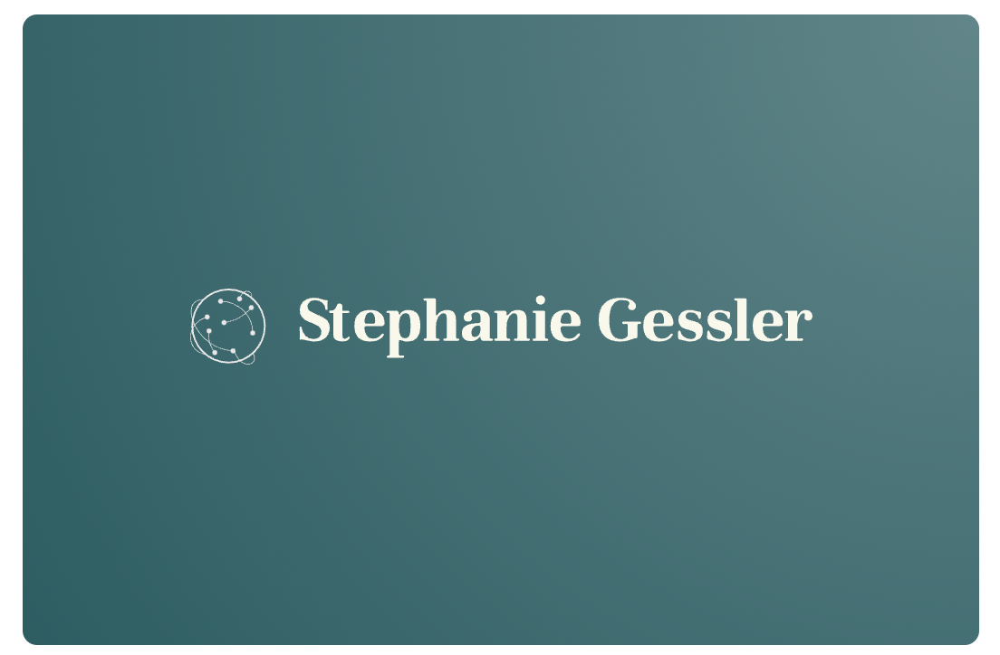

<H1 size =10><center>MBD-PT 2023 Social Network Analysis  </center></H1>
<HR></HR>
<H2 size =7><center> IMDB Movie Network Anylsis </center></H2>

# <font color='#1A846B' size="6"> Table of contents - PART 1  </font>
* [0. Description & General Objective](#0)
* [1. Import Libraries) ](#1)
* [2. Import Datasets](#2)
* [3. Graph Creation](#3)
  * [3.1) Create Graph in igraph](#3.1)   
  * [3.2 Create Graph in Networkx](#3.2)
* [4. Summary Statistics](#4)
    * [4.1) How many nodes are there?](#4.1)   
    * [4.2) How many edges are there?](#4.2)
* [5. Degree Distribution](#5)
    * [5.1) How does this distributions look like?](#5.1)
    * [5.2) What is the maximum degree?](#5.2)
    * [5.3) What is the minimum degree?](#6)
* [6.Network Diameter and Average Path Length](#6)
    * [6.1) What is the diameter of the graph?](#6.1)
    * [6.2) What is the avg path length of the graph?)](#6.2)
* [7.Node importance: Centrality measures](#7)
    * [5.2.Analysis of the dataset using EDA – Inspections](#5.2)
    * [5.3.Normal Test](#5.3)
    * [5.4.Checking Variable Completeness](#5.4)
* [6. Merged Datsets (inspections,network)](#6)
    * [6.1.Merge the two files](#6.1)
    * [6.2.Symmetrical Distribution (inspections,network)](#6.2)
    * [6.3.Analysis of the dataset using EDA – Merged](#6.3)
* [7. Baseline Dataset](#7)
* [8. Data Preparation and Feature Engineering](#8)
 * [8.1.One Hot Encoding](#8.1)
 * [8.2.Outlier Detection Treatment using Inter-Quartile Range rule Function](#8.2)

<a id='0'></a>
<h1 align="left"><font size="5" color='#1A846B'>  0.Instructions</font></h1>
On this first assignment, applying the basic functions of the Igraph package is required. The following datasets are going to be used:

* Actors dataset - undirected graph - : For the 2005 Graph Drawing conference a data set was provided of the IMDB movie database. We will use a reduced version of this dataset, which derived all actor-actor collaboration edges where the actors co-starred in at least 2 movies together between 1995 and 2004. 


You have to complete the code chunks in this document but also analyze the results, extract insights and answer the short questions. Fill the CSV attached with your answers, sometimes just the number is enough, some others just a small sentence or paragraph. Remember to change the header with your email.

In your submission please upload both this document in HTML and the CSV with the solutions.



<a id='1'></a>
<h1 align="left"><font size="5" color='#1A846B'>  2. Import Libraries </font></h1>

In [49]:
!pip install jupyter_contrib_nbextensions

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.5/23.5 MB 22.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.7/481.7 KB 39.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 48.9 MB/s eta 0:00:00
  Created wheel for jupyter_contrib_nbextensions: filename=jupyter_contrib_nbextensions-0.7.0-py2.py3-none-any.whl size=23428785 sha256=28280f55e3b5249df1de686a66a44b5f9fa8b9b7966bf686222a9561d035a68d
  Stored in directory: /root/.cache/pip/wheels/e7/99/91/7f24a075786a6760f3ac32ab5fa92e1d1a90e0d2cd8958adfd
  Created wheel for jupyter_contrib_core: filename=jupyter_contrib_core-0.4.2-py2.py3-none-any.whl size=17484 sha256=feea0f117e81b128384ef505a9d2a6234aec56deb3559c4ab296cb9a3c44598f
  Stored in directory: /root/.cache/pip/wheels/

In [50]:
!pip install python-igraph
!apt-get install libcairo2-dev libjpeg-dev libgif-dev
!pip install pycairo

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libcairo2-dev is already the newest version (1.16.0-4ubuntu1).
libgif-dev is already the newest version (5.1.9-1).
libjpeg-dev is already the newest version (8c-2ubuntu8).
0 upgraded, 0 newly installed, 0 to remove and 23 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [51]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import io
import igraph as ig

import numpy as np

import plotly.graph_objects as go

<a id='2'></a>
<h1 align="left"><font size="5" color='#1A846B'>  2. Import Dataset </font></h1>

# Loading data

In this section, the goal is loading the datasets given, building the graph and analyzing basics metrics. Include the edge or node attributes you consider.

Describe the values provided by summary function on the graph object.


In [52]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [68]:
# Read files
file = '/content/drive/MyDrive/imdb_actors_key_sol (1).csv'

nodes = pd.read_csv(file,sep=';')
nodes.head()

,id,ActorName,movies_95_04,main_genre,genres
0,n15629,"Rudder, Michael (I)",12,Thriller,"Action:1,Comedy:1,Drama:1,Fantasy:1,Horror:1,N..."
1,n5026,"Morgan, Debbi",16,Drama,"Comedy:2,Documentary:1,Drama:6,Horror:2,NULL:3..."
2,n11252,"Bellows, Gil",33,Drama,"Comedy:6,Documentary:1,Drama:7,Family:1,Fantas..."
3,n5150,"Dray, Albert",20,Comedy,"Comedy:6,Crime:1,Documentary:1,Drama:4,NULL:5,..."
4,n4057,"Daly, Shane (I)",18,Drama,"Comedy:2,Crime:1,Drama:7,Horror:1,Music:1,Musi..."


In [54]:
# Read files

file = 'drive/MyDrive/imdb_actor_edges_sol (1).csv'

edges = pd.read_csv(file,sep=';')
edges.head()

,from,to,weight
0,n17776,n17778,6
1,n5578,n9770,3
2,n5578,n929,2
3,n5578,n9982,2
4,n1835,n6278,2


In [ ]:
# Locally Read the csv file into dataframe 

#3df = pd.read_csv('/Users/stephaniegessler/Downloads/imdb_actors_key_sol (1).csv',sep=';')
#df.head()


In [55]:
#statistics of df
nodes.describe()

,movies_95_04
count,17577.000000
mean,20.545258
std,20.686926
min,10.000000
25%,12.000000
50%,15.000000
75%,22.000000
max,540.000000


In [56]:
value_counts =nodes['main_genre'].value_counts()

print(value_counts)

Drama        7302
Comedy       2928
Adult        1811
Romance      1027
Thriller      947
Crime         711
Music         631
Action        537
Sci-Fi        421
Family        359
Animation     284
Horror        171
Fantasy       137
War            69
Mystery        66
Adventure      63
Western        24
Musical        21
Name: main_genre, dtype: int64


In [ ]:
value_counts =nodes['ActorName'].value_counts()

print(value_counts)

Rudder, Michael (I)      1
Blakley, Claudie         1
Münster, Steffen         1
Cámara, Carlos           1
Gustave, Hervé P.        1
                        ..
Elizondo, Evangelina     1
von Sivers, Alexandre    1
Valentine, Vivian        1
MacLachlan, Kyle         1
Scott, Ridley            1
Name: ActorName, Length: 17577, dtype: int64


In [57]:
value_counts = nodes.groupby(['id']).size().count()
value_counts 

17577

In [70]:
# Split the 'genres' column by ',' to create separate columns for each genre
genres_df = nodes['genres'].str.split(',', expand=True)
genres_keys = set(genres_df.apply(lambda x: x.str.split(':', expand=True)[0]).values.flatten())
genres_keys.remove(None)
genres_keys.remove('NULL')
print(genres_keys)

df_with_genres = nodes.copy().drop('genres', axis=1)

def get_genre_count(x, genre):
    genre_counts = x.split(',')
    for genre_count in genre_counts:
        if genre_count.split(':')[0] == genre:
            return genre_count.split(':')[1]
    return 0

for genre in genres_keys:
    df_with_genres[genre] = nodes['genres'].apply(lambda x: get_genre_count(x, genre))

df_with_genres.head()

{'Adventure', 'Fantasy', 'Romance', 'Animation', 'Sci-Fi', 'Mystery', 'Family', 'Western', 'Adult', 'Drama', 'Horror', 'Thriller', 'Documentary', 'Comedy', 'Action', 'Musical', 'Crime', 'Short', 'Music', 'War'}


,id,ActorName,movies_95_04,main_genre,Adventure,Fantasy,Romance,Animation,Sci-Fi,Mystery,...,Horror,Thriller,Documentary,Comedy,Action,Musical,Crime,Short,Music,War
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,1,0,...,1,2,0,1,1,0,0,0,0,1
1,n5026,"Morgan, Debbi",16,Drama,0,0,2,0,0,0,...,2,0,1,2,0,0,0,0,0,0
2,n11252,"Bellows, Gil",33,Drama,0,1,6,0,0,2,...,1,4,1,6,0,0,0,2,0,0
3,n5150,"Dray, Albert",20,Comedy,0,0,1,0,0,0,...,0,1,1,6,0,0,1,1,0,0
4,n4057,"Daly, Shane (I)",18,Drama,0,0,1,0,0,0,...,1,4,0,2,0,1,1,0,1,0


In [59]:
df_with_genres.describe()

,movies_95_04
count,17577.000000
mean,20.545258
std,20.686926
min,10.000000
25%,12.000000
50%,15.000000
75%,22.000000
max,540.000000


In [60]:
#nodes = df_with_genres

In [ ]:
# locally Read the csv file into dataframe 
#df_key= pd.read_csv('/Users/stephaniegessler/Downloads/imdb_actor_edges_sol (1).csv',sep=';')
#df_key.head()

In [61]:
edges.describe()

,weight
count,287074.000000
mean,3.281206
std,2.991388
min,2.000000
25%,2.000000
50%,2.000000
75%,3.000000
max,118.000000


In [ ]:
#The total number of nodes in the graph

In [ ]:
value_counts = edges.groupby(['from', 'to']).size().count()

print(value_counts)

287074


<a id='3.1'></a>
<h1 align="left"><font size="5" color='#1A846B'>  3. Create Graph in igraph </font></h1>

In [62]:
# Create an Igraph graph
# Create the graph object
g = ig.Graph(directed=False)

# Add the nodes to the graph
g.add_vertices(nodes['id'])

# Add the edges to the graph
g.add_edges(list(zip(edges['from'], edges['to'])))

# Compute some basic metrics
print(g.summary())
print("Number of nodes:", len(g.vs))
print("Number of edges:", len(g.es))

IGRAPH UN-- 17577 287074 -- 
+ attr: name (v)
Number of nodes: 17577
Number of edges: 287074


In [ ]:
ig.plot(g, bbox=(1000, 600),vertex_color='green', target='myplot.png')

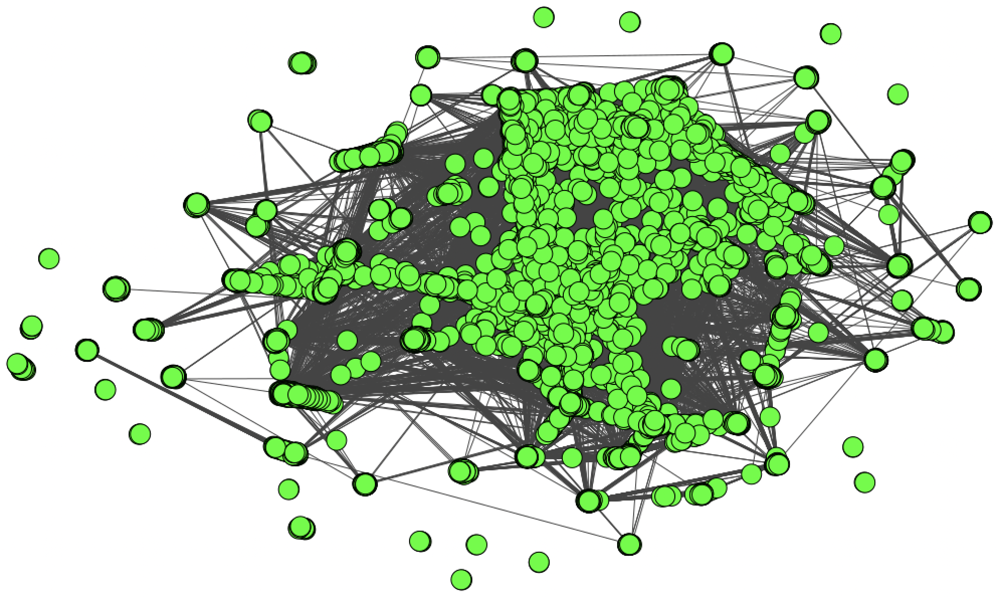

In [ ]:
# NetworkX Version

<a id='3.2'></a>
<h1 align="left"><font size="5" color='#1A846B'>  3.2 Create Graph in Networkx </font></h1>

In [71]:
# create an empty NetworkX graph
G = nx.Graph()

# add nodes to the graph
G.add_nodes_from(nodes['id'])

# add edges to the graph with weights
for index, row in edges.iterrows():
    G.add_edge(row['from'], row['to'], weight=row['weight'])

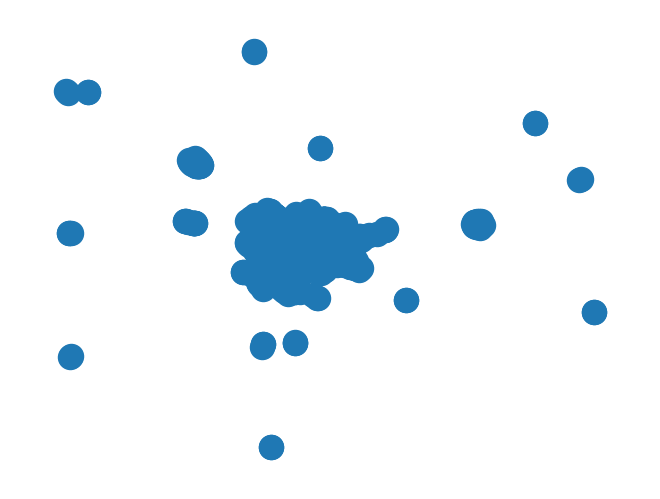

In [63]:
# create an empty NetworkX graph
G = nx.Graph()

# add nodes to the graph
G.add_nodes_from(nodes['id'])

# add edges to the graph with weights
for index, row in edges.iterrows():
    G.add_edge(row['from'], row['to'], weight=row['weight'])

#G.add_edges_from(zip(df_key["from"], df_key["to"]))

# draw the graph
nx.draw(G)
plt.show()

In [65]:
# Iterate over the rows of the nodes dataframe
for i, row in nodes.iterrows():
    # Add the node to the graph with attributes
    G.add_node(row['id'], ActorName=row['ActorName'], movies_95_04=row['movies_95_04'], main_genre=row['main_genre'], genres=row['genres'])


KeyError: ignored

In [ ]:
nx.number_connected_components(G)

19

In [ ]:
# Get the connected components
components = g.clusters()

# Print the size and membership of each component
for i, c in enumerate(components):
    print(f"Component {i} has size {len(c)} and contains vertices {c}")
    membership = components.membership
    for j, v in enumerate(g.vs):
        if membership[j] == i:
            print(f"Vertex {v.index} is in component {i}")

<ipython-input-38-960d4062dfb0>:2: DeprecationWarning: Graph.clusters() is deprecated; use Graph.connected_components() instead
  components = g.clusters()


Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
Vertex 12673 is in component 0
Vertex 12674 is in component 0
Vertex 12675 is in component 0
Vertex 12676 is in component 0
Vertex 12677 is in component 0
Vertex 12678 is in component 0
Vertex 12679 is in component 0
Vertex 12680 is in component 0
Vertex 12681 is in component 0
Vertex 12682 is in component 0
Vertex 12683 is in component 0
Vertex 12684 is in component 0
Vertex 12685 is in component 0
Vertex 12686 is in component 0
Vertex 12687 is in component 0
Vertex 12688 is in component 0
Vertex 12689 is in component 0
Vertex 12690 is in component 0
Vertex 12691 is in component 0
Vertex 12692 is in component 0
Vertex 12693 is in component 0
Vertex 12694 is in component 0
Vertex 12695 is in component 0
Vertex 12696 is in component 0
Vertex 12697 is in component 0
Vertex 12698 is in component 0
Vertex 12699 is in component 0
Vertex 12700 is in component 0
Vertex 12701 is in component 0
Vertex 12702 is in component 0
Ver

<a id='4.1'></a>
<a id='4.2'></a>
<h1 align="left"><font size="5" color='#1A846B'>  4.1. How many nodes are there? </font></h1>
<h1 align="left"><font size="5" color='#1A846B'>  4.2. How many edges are there? </font></h1>

In [ ]:
#I graph

In [ ]:
# Compute some basic metrics
print(g.summary())
print("Number of nodes:", len(g.vs))
print("Number of edges:", len(g.es))

In [ ]:
print(g.ecount())

287074


In [ ]:
#NetworkX 

In [ ]:
num_nodes = nx.number_of_nodes(G)
num_edges = nx.number_of_edges(G)
density = nx.density(G)
transitivity = nx.transitivity(G)
avg_clustering = nx.average_clustering(G)
print("Number of Nodes: %s" % num_nodes)
print("Number of Edges: %s" % num_edges)
print("Density: %s" % density)
print("Transitivity: %s" % transitivity)
print("Avg. Clustering: %s" % avg_clustering)

Number of Nodes: 17577
Number of Edges: 287074
Density: 0.001858484997760941
Transitivity: 0.3666203673687031
Avg. Clustering: 0.3390564076688012


In [ ]:
# Print results
print("Total number of nodes:", G.number_of_nodes())
print("Total number of edges:", G.number_of_edges())
print("Degree distribution:", degree_count)
print("Maximum degree:", max(degree_sequence))
print("Minimum degree:", min(degree_sequence))

In [ ]:
#list edges in G
G.edges()

EdgeView([('n15629', 'n4367'), ('n15629', 'n6865'), ('n15629', 'n6907'), ('n15629', 'n4366'), ('n15629', 'n6643'), ('n15629', 'n6655'), ('n15629', 'n15635'), ('n15629', 'n6755'), ('n15629', 'n15631'), ('n15629', 'n7984'), ('n15629', 'n6845'), ('n15629', 'n6778'), ('n15629', 'n6815'), ('n15629', 'n6829'), ('n15629', 'n6908'), ('n15629', 'n3476'), ('n15629', 'n6910'), ('n15629', 'n6659'), ('n15629', 'n6844'), ('n15629', 'n15636'), ('n15629', 'n3720'), ('n15629', 'n6892'), ('n15629', 'n6644'), ('n15629', 'n15627'), ('n15629', 'n3703'), ('n15629', 'n6759'), ('n15629', 'n3707'), ('n15629', 'n4450'), ('n15629', 'n6894'), ('n15629', 'n6758'), ('n15629', 'n7942'), ('n15629', 'n3939'), ('n15629', 'n4453'), ('n15629', 'n9783'), ('n15629', 'n3743'), ('n15629', 'n4361'), ('n5026', 'n3356'), ('n5026', 'n3429'), ('n5026', 'n3948'), ('n5026', 'n5031'), ('n5026', 'n5021'), ('n5026', 'n3143'), ('n5026', 'n1529'), ('n5026', 'n5032'), ('n5026', 'n14814'), ('n5026', 'n4255'), ('n5026', 'n490'), ('n5026', 

In [ ]:
# Build graph
G = nx.Graph()

# Add nodes
G.add_nodes_from(df["id"])

# Add edges
for index, row in df_key.iterrows():
    G.add_edge(row["from"], row["to"], weight=row["weight"])

# Compute total degree distribution
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)
degree_count = {}
for d in degree_sequence:
    degree_count[d] = degree_count.get(d, 0) + 1

# Print results
print("Total number of nodes:", G.number_of_nodes())
print("Total number of edges:", G.number_of_edges())
print("Degree distribution:", degree_count)
print("Maximum degree:", max(degree_sequence))
print("Minimum degree:", min(degree_sequence))

Total number of nodes: 17577
Total number of edges: 287074
Degree distribution: {784: 1, 610: 1, 599: 1, 584: 1, 561: 1, 555: 1, 545: 1, 533: 1, 500: 1, 493: 1, 490: 1, 475: 1, 471: 2, 463: 1, 457: 1, 451: 1, 450: 1, 438: 1, 428: 1, 427: 1, 419: 1, 417: 1, 416: 1, 410: 1, 402: 1, 400: 1, 398: 1, 395: 2, 393: 2, 392: 1, 382: 1, 377: 1, 376: 3, 372: 2, 366: 1, 365: 1, 361: 1, 358: 1, 355: 2, 350: 2, 346: 2, 345: 2, 341: 1, 340: 1, 336: 1, 335: 1, 334: 2, 333: 1, 331: 1, 326: 1, 324: 2, 323: 1, 320: 2, 319: 1, 318: 2, 314: 2, 313: 1, 312: 1, 311: 1, 310: 1, 300: 1, 299: 1, 298: 1, 297: 1, 295: 1, 294: 1, 293: 1, 289: 3, 287: 2, 286: 1, 283: 2, 280: 3, 279: 1, 278: 1, 275: 4, 272: 2, 270: 2, 269: 1, 267: 1, 266: 1, 265: 3, 263: 3, 262: 3, 260: 2, 259: 3, 258: 2, 257: 3, 256: 1, 255: 1, 254: 3, 253: 3, 252: 2, 251: 2, 250: 1, 246: 1, 245: 3, 244: 2, 243: 1, 242: 1, 241: 2, 240: 3, 239: 1, 236: 1, 235: 1, 233: 1, 232: 2, 231: 4, 229: 3, 228: 1, 227: 4, 226: 2, 225: 8, 224: 3, 223: 2, 222: 4,

# Degree distribution

Analyse the degree distribution. Compute the total degree distribution.

**3) How does this distributions look like?**

**4) What is the maximum degree?**

**5) What is the minum degree?**

In [ ]:
import plotly.graph_objs as go
from collections import Counter

degree_sequence = sorted([d for n, d in G.degree()], reverse=True) 
degree_count = Counter(degree_sequence)

total_nodes = len(G.nodes)
cumulative_degree_count = [sum(list(degree_count.values())[:i+1])/total_nodes for i in range(len(degree_count))]

fig = go.Figure(data=go.Scatter(x=list(degree_count.keys()), y=cumulative_degree_count, mode='lines', line_color='purple'))
fig.update_layout(xaxis_title='Degree', yaxis_title='Cumulative Distribution')
fig.show()


In [ ]:
%matplotlib inline

In [ ]:
import plotly.graph_objects as go

# Get the degree distribution
degree_dist = g.degree_distribution()

# Convert the degree distribution to a list of tuples
degree_dist = [(bin_left, count) for bin_left, _, count in degree_dist.bins()]

# Sort the list of tuples by the bin left value
degree_dist = sorted(degree_dist, key=lambda x: x[0])

# Plot the degree distribution
fig = go.Figure()
fig.add_trace(go.Scatter(x=[x[0] for x in degree_dist], y=[x[1] for x in degree_dist], mode='lines', line=dict(color='red')))
fig.update_layout(xaxis_title='Degree', yaxis_title='Count')
fig.show()


In [ ]:
# Compute total degree distribution
degree_sequence = g.degree()

# Compute degree counts
degree_count = {}
for degree in degree_sequence:
    degree_count[degree] = degree_count.get(degree, 0) + 1

# Print results
print("Total number of nodes:", g.vcount())
print("Total number of edges:", g.ecount())
print("Degree distribution:", degree_count)
print("Maximum degree:", max(degree_sequence))

Total number of nodes: 17577
Total number of edges: 287074
Degree distribution: {36: 109, 23: 230, 22: 273, 46: 90, 18: 353, 5: 655, 6: 664, 57: 42, 11: 521, 7: 661, 93: 22, 47: 85, 25: 235, 19: 316, 107: 14, 1: 475, 8: 585, 123: 13, 78: 24, 74: 46, 34: 158, 24: 231, 30: 161, 2: 597, 26: 209, 13: 411, 16: 377, 21: 291, 9: 604, 51: 71, 29: 209, 66: 44, 56: 60, 3: 634, 84: 26, 61: 49, 102: 14, 31: 180, 4: 683, 28: 202, 12: 485, 145: 9, 15: 425, 14: 404, 289: 3, 83: 31, 92: 23, 37: 104, 10: 553, 44: 96, 43: 97, 345: 2, 27: 222, 45: 93, 54: 53, 160: 8, 174: 4, 118: 8, 144: 7, 20: 284, 105: 21, 97: 22, 77: 40, 32: 168, 59: 56, 104: 20, 90: 21, 33: 141, 146: 10, 87: 26, 52: 66, 70: 35, 49: 79, 71: 39, 53: 72, 86: 23, 82: 18, 35: 133, 60: 53, 81: 34, 181: 13, 17: 328, 68: 50, 184: 9, 162: 7, 94: 24, 39: 115, 179: 9, 41: 118, 147: 9, 50: 80, 216: 4, 40: 127, 180: 6, 42: 92, 190: 6, 241: 2, 157: 6, 131: 9, 55: 63, 80: 31, 63: 61, 99: 22, 194: 6, 76: 31, 140: 10, 125: 9, 392: 1, 438: 1, 38: 114,

In [ ]:
# calculate the degrees of all nodes
degrees = g.degree()

# create a DataFrame from the dictionary
df_degrees = pd.DataFrame({'node': g.vs['name'], 'degree': degrees})

# print the DataFrame
print(df_degrees)

         node  degree
0      n15629      36
1       n5026      23
2      n11252      22
3       n5150      23
4       n4057      46
...       ...     ...
17572  n16211      18
17573   n4910       5
17574   n5746      57
17575   n1645     350
17576   n8474      62

[17577 rows x 2 columns]


In [ ]:
# Calculate the degrees of all nodes
degrees = g.degree()

# Find the node with the maximum degree
max_degree_node = max(range(len(degrees)), key=degrees.__getitem__)

# Find the node with the minimum degree
min_degree_node = min(range(len(degrees)), key=degrees.__getitem__)

# Print the node IDs and their degrees
print("Node with the maximum degree:", max_degree_node, "Degree:", degrees[max_degree_node])
print("Node with the minimum degree:", min_degree_node, "Degree:", degrees[min_degree_node])


Node with the maximum degree: 12147 Degree: 784
Node with the minimum degree: 20 Degree: 1


In [ ]:
# get the vertex with the highest degree
max_degree_vertex = g.vs.select(_degree = max(g.degree()))[0]

# get the name of the vertex
max_actor = max_degree_vertex['name']

# get the vertex with the lowest degree
min_degree_vertex = g.vs.select(_degree = min(g.degree()))[0]

# get the name of the vertex
min_actor = min_degree_vertex['name']

print("Actor with the maximum degree:", max_actor)
print("Actor with the minimum degree:", min_actor)


Actor with the maximum degree: n162
Actor with the minimum degree: n9764


In [ ]:
min_degree = min(g.degree())
min_nodes = [v.index for v in g.vs if v.degree() == min_degree]
print("Actor(s) with the minimum degree:", min_nodes)

Actor(s) with the minimum degree: [20, 41, 68, 76, 114, 138, 146, 163, 189, 248, 252, 262, 312, 367, 433, 450, 484, 504, 524, 527, 646, 683, 706, 709, 754, 755, 760, 830, 871, 878, 896, 971, 1075, 1142, 1158, 1161, 1206, 1359, 1373, 1401, 1419, 1427, 1478, 1483, 1495, 1570, 1587, 1604, 1626, 1631, 1652, 1653, 1681, 1736, 1772, 1822, 1824, 1918, 1954, 1980, 1983, 2026, 2031, 2042, 2060, 2127, 2169, 2175, 2189, 2345, 2445, 2449, 2461, 2480, 2499, 2502, 2545, 2631, 2678, 2768, 2802, 2838, 2882, 2923, 2979, 2980, 3000, 3039, 3049, 3065, 3120, 3156, 3165, 3167, 3248, 3249, 3267, 3269, 3288, 3297, 3312, 3350, 3457, 3485, 3518, 3527, 3568, 3570, 3595, 3602, 3606, 3613, 3635, 3717, 3736, 3815, 3817, 3886, 3910, 3919, 3997, 4053, 4093, 4111, 4150, 4166, 4174, 4242, 4247, 4284, 4293, 4307, 4335, 4343, 4427, 4463, 4510, 4735, 4757, 4773, 4789, 4831, 4996, 5075, 5081, 5104, 5175, 5219, 5244, 5284, 5330, 5341, 5383, 5441, 5505, 5527, 5577, 5636, 5651, 5714, 5730, 5857, 5879, 5909, 5957, 5998, 6010,

In [ ]:
# calculate the degrees of all nodes
degrees = g.degree()

# create a DataFrame from the dictionary
df_degrees = pd.DataFrame({'node': g.vs['name'], 'degree': degrees})

# get the maximum degree and corresponding actors
max_degree = df_degrees['degree'].max()
actors_with_max_degree = df_degrees.loc[df_degrees['degree'] == max_degree, 'node'].tolist()

# get the minimum degree and corresponding actors
min_degree = df_degrees['degree'].min()
actors_with_min_degree = df_degrees.loc[df_degrees['degree'] == min_degree, 'node'].tolist()

# print the results
print("Actors with the maximum degree:", actors_with_max_degree)
print("Actors with the minimum degree:", actors_with_min_degree)

Actors with the maximum degree: ['n162']
Actors with the minimum degree: ['n9764', 'n6151', 'n17479', 'n10577', 'n11616', 'n14370', 'n15989', 'n1479', 'n17623', 'n14631', 'n16224', 'n11477', 'n17093', 'n8316', 'n11572', 'n12592', 'n17250', 'n15576', 'n11977', 'n7607', 'n7063', 'n15803', 'n12596', 'n3698', 'n2028', 'n3838', 'n8809', 'n11452', 'n7742', 'n2105', 'n17800', 'n12164', 'n13888', 'n14870', 'n7186', 'n11369', 'n17860', 'n9128', 'n6979', 'n4888', 'n10942', 'n17388', 'n10120', 'n16362', 'n17633', 'n13435', 'n16661', 'n17915', 'n10967', 'n12244', 'n14848', 'n11592', 'n15747', 'n15782', 'n9182', 'n10569', 'n7468', 'n2802', 'n4250', 'n15115', 'n7937', 'n9378', 'n11606', 'n14444', 'n4380', 'n7017', 'n12264', 'n13660', 'n13327', 'n17842', 'n17910', 'n15839', 'n15744', 'n17882', 'n16829', 'n16888', 'n8841', 'n11550', 'n17533', 'n17447', 'n16072', 'n4049', 'n8421', 'n8454', 'n5718', 'n10394', 'n4976', 'n10691', 'n6746', 'n6587', 'n17477', 'n15221', 'n13904', 'n17242', 'n4082', 'n15810',

In [ ]:
# calculate the degree of each node
degrees = g.degree()

# find the node with the minimum degree
min_degree = min(degrees)
min_nodes = [i for i, deg in enumerate(degrees) if deg == min_degree]

# find the node with the maximum degree
max_degree = max(degrees)
max_nodes = [i for i, deg in enumerate(degrees) if deg == max_degree]

# print the names of the actors with minimum and maximum degrees
min_actors = df.iloc[min_nodes]['ActorName'].tolist()
max_actors = df.iloc[max_nodes]['ActorName'].tolist()

print("Actors with minimum degree:", min_actors)
print("Actors with maximum degree:", max_actors)


Actors with minimum degree: ['Sokoloff, Marla', 'Bonham-Carter, Crispin', 'Nagatsuka, Kyozo', 'R&apos;Mante, Adrian', 'Moore, Rudy Ray', 'Young, Dey', 'Lemche, Kris', 'Schönemann, Hinnerk', 'Peluffo, Mariano', 'Ulliel, Gaspard', 'Offerman, Nick', 'Rieck, Billy', 'Busse, John', 'Krusiec, Michelle', 'Baruc, Siri', 'Collins, Paul (I)', 'Peterson, Cassandra', 'Kurtiz, Tuncel', 'Bossa, Luly', 'de Mylius, Jørgen', 'Newton, Wayne', 'Stuart, James Patrick', 'Julien, Jean-Luc', 'Douglas, Shirley', 'Michael, Christopher', 'Davis, Sarah Scott', 'Van Wormer, Steve', 'Dempsey, Michael (I)', 'Zehetner, Nora', 'Romeo, Marc', 'Ravitz, Nati', 'Jennings, Brent', 'Jacot, Christopher', 'Mylan, Richard', 'Polk, Stephen', 'Ryan, Thomas Jay', 'Nørbygård, Finn', 'Leroux, Maxime', 'Drake, David (I)', 'Cooper, Rowena', 'Blanche, Robert', 'Karsenti, Sabine', 'Fernandez, Peter (I)', 'Wu, Robert', 'Shakibai, Khosro', 'Söllner, Pippi', 'Bomonde, Betty', 'Polonia, John', 'Hoffman, Jackie', 'Werner, Roy', 'Godboldo, 

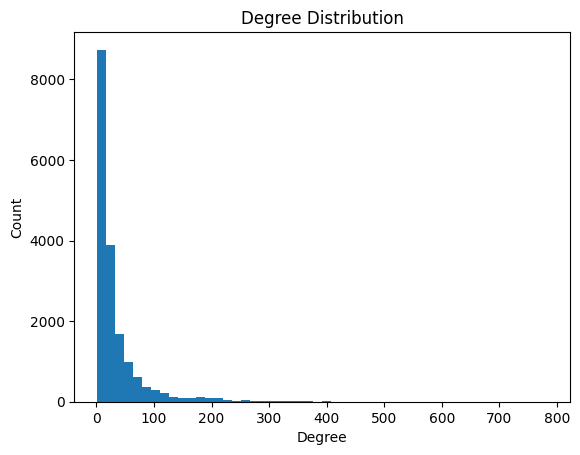

In [ ]:

# Calculate degree distribution of the graph
degree_sequence = [d for n, d in G.degree()]

# Plot degree distribution histogram
plt.hist(degree_sequence, bins=50)
plt.xlabel('Degree')
plt.ylabel('Count')
plt.title('Degree Distribution')
plt.show()

In [ ]:
import plotly.express as px

In [ ]:
# Plot degree distribution histogram using Plotly
fig = px.histogram(degree_sequence, nbins=50)
fig.update_layout(title='Degree Distribution', xaxis_title='Degree', yaxis_title='Count')
fig.show()

In [ ]:
G = nx.Graph()

# add some nodes and edges

# check if the graph is directed or not
if nx.is_directed(G):
    print("The graph is directed.")
else:
    print("The graph is not directed.")

The graph is not directed.


In [ ]:
# calculate the degrees of all nodes
degrees = dict(G.degree())

# create a DataFrame from the dictionary
df_degrees = pd.DataFrame({'node': list(degrees.keys()), 'degree': list(degrees.values())})

# print the DataFrame
print(df_degrees)

         node  degree
0      n15629      36
1       n5026      23
2      n11252      22
3       n5150      23
4       n4057      46
...       ...     ...
17572  n16211      18
17573   n4910       5
17574   n5746      57
17575   n1645     350
17576   n8474      62

[17577 rows x 2 columns]


In [ ]:
# find the actor names corresponding to the maximum and minimum degrees
max_actor = max(degrees, key=degrees.get)
min_actor = min(degrees, key=degrees.get)

print("Actor with the maximum degree:", max_actor)
print("Actor with the minimum degree:", min_actor)

Actor with the maximum degree: n162
Actor with the minimum degree: n9764


In [ ]:
max_degree = max(dict(G.degree()).values())
nodes_with_max_degree = [k for k, v in dict(G.degree()).items() if v == max_degree]
print("Nodes with maximum degree:", nodes_with_max_degree)


Nodes with maximum degree: ['n162']


In [ ]:
# Filter the dateframe to only include the nodes with maximum degree
df_max_degree = df[df['id'].isin(nodes_with_max_degree)]
df_max_degree


,id,ActorName,movies_95_04,main_genre,genres
12147,n162,"Davis, Mark (V)",540,Adult,"Action:1,Adult:429,Comedy:3,Crime:1,Documentar..."


In [ ]:
min_degree = min(dict(G.degree()).values())
nodes_with_min_degree = [k for k, v in dict(G.degree()).items() if v == min_degree]
print("Nodes with minimum degree:", nodes_with_min_degree)


Nodes with minimum degree: ['n9764', 'n6151', 'n17479', 'n10577', 'n11616', 'n14370', 'n15989', 'n1479', 'n17623', 'n14631', 'n16224', 'n11477', 'n17093', 'n8316', 'n11572', 'n12592', 'n17250', 'n15576', 'n11977', 'n7607', 'n7063', 'n15803', 'n12596', 'n3698', 'n2028', 'n3838', 'n8809', 'n11452', 'n7742', 'n2105', 'n17800', 'n12164', 'n13888', 'n14870', 'n7186', 'n11369', 'n17860', 'n9128', 'n6979', 'n4888', 'n10942', 'n17388', 'n10120', 'n16362', 'n17633', 'n13435', 'n16661', 'n17915', 'n10967', 'n12244', 'n14848', 'n11592', 'n15747', 'n15782', 'n9182', 'n10569', 'n7468', 'n2802', 'n4250', 'n15115', 'n7937', 'n9378', 'n11606', 'n14444', 'n4380', 'n7017', 'n12264', 'n13660', 'n13327', 'n17842', 'n17910', 'n15839', 'n15744', 'n17882', 'n16829', 'n16888', 'n8841', 'n11550', 'n17533', 'n17447', 'n16072', 'n4049', 'n8421', 'n8454', 'n5718', 'n10394', 'n4976', 'n10691', 'n6746', 'n6587', 'n17477', 'n15221', 'n13904', 'n17242', 'n4082', 'n15810', 'n6367', 'n17807', 'n13653', 'n7395', 'n9301'

In [ ]:
#Filter dataframe to only include the nodes with minimum degree
df_min_degree = df[df['id'].isin(nodes_with_min_degree)]
df_min_degree

,id,ActorName,movies_95_04,main_genre,genres
20,n9764,"Sokoloff, Marla",11,Comedy,"Comedy:3,Crime:1,Drama:2,NULL:1,Romance:1,Sci-..."
41,n6151,"Bonham-Carter, Crispin",10,Drama,"Comedy:1,Crime:1,Drama:3,Horror:1,NULL:2,Roman..."
68,n17479,"Nagatsuka, Kyozo",10,Romance,"Drama:2,NULL:5,Romance:3"
76,n10577,"R&apos;Mante, Adrian",10,Comedy,"Comedy:3,Documentary:1,Drama:2,Family:1,Music:..."
114,n11616,"Moore, Rudy Ray",12,Comedy,"Comedy:7,Documentary:1,Horror:1,Music:1,NULL:1..."
...,...,...,...,...,...
17432,n13307,"Doyle, John (I)",11,Comedy,"Comedy:9,Documentary:2"
17440,n16798,"Quartaroli, Peter",10,Romance,"Adventure:1,Comedy:1,Crime:1,Drama:1,NULL:1,Ro..."
17467,n13581,"Hassan, Jalaluddin",14,Romance,"Comedy:1,Drama:5,NULL:1,Romance:6,Sci-Fi:1"
17476,n8501,"Rogers, AnnieScott",13,Romance,"Comedy:1,Drama:1,NULL:5,Romance:1,Short:4,Thri..."


# Network Diameter and Average Path Length

You have functions in igraph to calculate the diameter and the average path length. Think if you should consider the weights, the directions, etc.

**6) What is the diameter of the graph?**

**7) What is the avg path length of the graph?**

In [ ]:
for C in (G.subgraph(c).copy() for c in nx.connected_components(G)):
    print(nx.average_shortest_path_length(C))

4.890557890566182
3.329004329004329
3.225296442687747
1.0
3.3011363636363638
1.0
1.3333333333333333
1.9090909090909092
1.0
1.0
1.0
1.0
1.0
1.0
1.3333333333333333
1.0
1.0
1.0
1.0


In [ ]:
# Calculate diameter of the graph
diameter = g.diameter(directed=True)

# Calculate average path length of the graph
avg_path_length = g.average_path_length(directed=True)


In [ ]:
diameter = g.diameter(directed=True)
print("Diameter of the graph:", diameter)


Diameter of the graph: 16


In [75]:


# Assume that you have already created your graph G

# Get the connected component subgraphs of G
components = list(nx.connected_component_subgraphs(G))

# Compute the diameter of each connected component
for i, comp in enumerate(components):
    diameter = nx.algorithms.distance_measures.diameter(comp)
    print(f"Diameter of connected component {i+1}: {diameter}")

AttributeError: ignored

In [ ]:
import networkx as nx

# Assume that you have already created your graph G

# Get the connected components of G
components = list(nx.connected_components(G))

# Compute the diameter of each connected component
for i, comp in enumerate(components):
    subgraph = G.subgraph(comp)
    diameter = nx.algorithms.distance_measures.diameter(subgraph)
    print(f"Diameter of connected component {i+1}: {diameter}")


In [48]:
import networkx as nx

# Assume that you have already created your graph G

# Get the connected components of G
components = list(nx.connected_components(G))

# Compute the diameter of each connected component
for i, comp in enumerate(components):
    subgraph = G.subgraph(comp)
    diameter = nx.algorithms.distance_measures.diameter(subgraph)
    print(f"Diameter of connected component {i+1}: {diameter}")


KeyboardInterrupt: ignored

In [ ]:
avg_path_length = g.average_path_length(directed=True)
print("Average path length of the graph:", avg_path_length)


Average path length of the graph: 4.890545545798965


In [ ]:
#I graph 

In [ ]:
# compute the diameter of the graph
diameter = g.diameter(directed=False)
print("Diameter:", diameter)

# compute the average path length of the graph
avg_path_length = g.average_path_length(directed=False)
print("Average path length:", avg_path_length)

Diameter: 16
Average path length: 4.890545545798965


# Node importance: Centrality measures

(Optional but recommended): Obtain the distribution of the number of movies made by an actor and the number of genres in which an actor starred in. It may be useful to analyze and discuss the results to be obtained in the following exercises.

In [77]:

# Assuming your data is stored in a pandas DataFrame called df
fig = px.histogram(nodes, x='movies_95_04', nbins=100)
fig.show()

In [80]:
import pandas as pd
import plotly.graph_objs as go
import plotly.io as pio

# Assume that you have already created your DataFrame df

# Get the value counts of movies_95_04 column
counts = nodes['movies_95_04'].value_counts()

# Create a new DataFrame with counts as a column
counts_df = pd.DataFrame({'Count': counts})

# Sort the DataFrame by the index (which is the number of movies)
counts_df = counts_df.sort_index()

# Print the counts in a tabular format
print(counts_df)

# Create a bar graph of the value counts using Plotly
fig = go.Figure(data=[go.Bar(x=counts_df.index, y=counts_df['Count'])])
fig.update_layout(title='Movie Count Distribution (1995-2004)', xaxis_title='Number of Movies', yaxis_title='Count')
pio.show(fig)


     Count
10    2302
11    1853
12    1570
13    1322
14    1149
..     ...
429      1
435      1
460      1
467      1
540      1

[194 rows x 1 columns]


In [85]:
nodes['no_of_genres'] = nodes['genres'].str.count(',') + 1


In [87]:
genre_counts = nodes[['no_of_genres']].value_counts()
print(genre_counts)


no_of_genres
6               3107
7               2691
5               2564
8               2056
4               1657
9               1401
3                970
2                916
10               831
11               518
12               342
13               222
14               114
1                 94
15                48
16                33
17                 9
18                 3
19                 1
dtype: int64


In [ ]:
import plotly.express as px

fig = px.histogram(df, x="movies_95_04", nbins=30, title="Distribution of Number of Movies Made by Actors")
fig.update_layout(xaxis_title="Number of Movies", yaxis_title="Count")
fig.show()

In [ ]:
# convert 'movies_95_04' column to integer data type
df_with_genres['movies_95_04'] = df_with_genres['movies_95_04'].astype(int)

# get distribution of number of movies by actor
movies_by_actor = df_with_genres.groupby('ActorName')['movies_95_04'].sum()

# get distribution of number of genres by actor
# convert 'main_genre' column to string data type
df_with_genres['main_genre'] = df_with_genres['main_genre'].astype(str)
genres_by_actor = df_with_genres.groupby('ActorName')['main_genre'].nunique()

In [ ]:
import plotly.express as px

fig = px.histogram(df_with_genres, x='main_genre', nbins=len(df_with_genres['main_genre'].unique()), color_discrete_sequence=['#636EFA'])
fig.update_layout(
    title='Distribution of Actors by Main Genre',
    xaxis_title='Main Genre',
    yaxis_title='Number of Actors'
)
fig.show()

In [ ]:
print(df_with_genres.dtypes)

id              object
ActorName       object
movies_95_04     int64
main_genre      object
Musical         object
Short           object
Adventure       object
Romance         object
Animation       object
War             object
Drama           object
Thriller        object
Action          object
Western         object
Documentary     object
Mystery         object
Comedy          object
Crime           object
Family          object
Sci-Fi          object
Horror          object
Fantasy         object
Adult           object
Music           object
dtype: object


In [ ]:
cols_to_convert = df_with_genres.columns.drop(['id', 'ActorName','main_genre'])
df_with_genres[cols_to_convert] = df_with_genres[cols_to_convert].apply(pd.to_numeric, errors='coerce')


In [ ]:
import plotly.graph_objs as go
import plotly.subplots as sp

# create subplots
fig = sp.make_subplots(rows=9, cols=4, subplot_titles=df_with_genres.columns[3:])

# loop over columns and add histogram
for i, col in enumerate(df_with_genres.columns[3:]):
    row_num = (i // 4) + 1
    col_num = (i % 4) + 1
    fig.add_trace(go.Histogram(x=df_with_genres[col], name=col), row=row_num, col=col_num)

# update layout
fig.update_layout(height=2000, width=1000, title='Distribution of Genres in Movies')

# show plot
fig.show()

In [ ]:
import pandas as pd
import plotly.graph_objects as go

# create a new dataframe with only the columns of interest
df_genres_count = df_with_genres.iloc[:, 4:].sum()

# create a bar chart for the counts of each genre
fig = go.Figure(go.Bar(x=df_genres_count.index, y=df_genres_count.values))
fig.update_layout(title='Number of Movies per Genre', xaxis_title='Genre', yaxis_title='Count')
fig.show()


In [ ]:
import plotly.express as px

fig = px.histogram(df_with_genres, x="movies_95_04", nbins=20,
                   labels={"movies_95_04": "# of movies"},
                   title="# of movies per actor")
fig.show()

In [ ]:
df_with_genres.columns

Index(['id', 'ActorName', 'movies_95_04', 'main_genre', 'Musical', 'Short',
       'Adventure', 'Romance', 'Animation', 'War', 'Drama', 'Thriller',
       'Action', 'Western', 'Documentary', 'Mystery', 'Comedy', 'Crime',
       'Family', 'Sci-Fi', 'Horror', 'Fantasy', 'Adult', 'Music'],
      dtype='object')

Obtain three vectors with the degree, betweeness 

*   Listeneintrag
*   Listeneintrag

and closeness for each vertex of the actors' graph.

In [ ]:
# Compute the degree, betweenness, and closeness centrality measures
degrees = g.degree()
betweenness = g.betweenness()
closeness = g.closeness()

# Print the first 10 values of each measure
print("Degree:", degrees[:10])
print("Betweenness:", betweenness[:10])
print("Closeness:", closeness[:10])

Degree: [36, 23, 22, 23, 46, 18, 5, 6, 57, 11]
Betweenness: [4538.479886479109, 13490.77200541757, 14799.35933084289, 74142.79928420001, 34191.33516628616, 31840.569502765193, 5979.633506852895, 15.323094111147999, 16887.10504175236, 1.019401972978146]
Closeness: [0.2327851798503581, 0.25464307077309134, 0.23910571667328795, 0.23890280458259763, 0.2413406894263077, 0.24755339971066292, 0.2197710875231368, 0.22166061314165247, 0.2629129196981337, 0.1983364014454217]


In [ ]:
import networkx as nx

# Create the graph using the Actor_dict dictionary

# Degree centrality
degree_centrality = nx.degree_centrality(G)

# Betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G)

# Closeness centrality
closeness_centrality = nx.closeness_centrality(G)

Obtain the list of the 20 actors with the largest degree centrality. It can be useful to show a list with the degree, the name of the actor, the number of movies, the main genre, and the number of genres in which the actor has participated.

**8) Who is the actor with highest degree centrality?**

**9) How do you explain the high degree of the top-20 list??**

In [ ]:
# Get the degree centrality of each actor
degree = g.degree()

# Create a dataframe with the actor ids and their degree centrality
degree_df = pd.DataFrame({'id': g.vs['name'], 'Degree': degree})

# Merge the degree dataframe with the nodes dataframe to get additional information
merged_df = pd.merge(degree_df, nodes, on='id')

# Sort the merged dataframe by degree centrality in descending order and get the top 20 actors
top_actors = merged_df.sort_values('Degree', ascending=False).head(20)

# Print the top actors with their degree, name, number of movies, main genre, and number of genres participated in
print(top_actors[['Degree', 'ActorName', 'movies_95_04', 'main_genre', 'genres']])


       Degree            ActorName  movies_95_04 main_genre  \
12147     784      Davis, Mark (V)           540      Adult   
1761      610    Sanders, Alex (I)           467      Adult   
13442     599     North, Peter (I)           460      Adult   
11272     584          Marcus, Mr.           435      Adult   
4092      561       Tedeschi, Tony           364      Adult   
8354      555           Dough, Jon           300      Adult   
5968      545      Stone, Lee (II)           403      Adult   
2236      533        Voyeur, Vince           370      Adult   
5752      500  Lawrence, Joel (II)           315      Adult   
15511     493    Steele, Lexington           429      Adult   
16429     490          Ashley, Jay           309      Adult   
17062     475            Boy, T.T.           336      Adult   
10548     471          Jeremy, Ron           280      Adult   
8843      471  Cannon, Chris (III)           287      Adult   
6840      463           Bune, Tyce           267      A

High degree centrality in actors means that they have appeared in a large number of movies or have been involved in a large number of collaborations with other actors. This can indicate their popularity, influence, and potentially their expertise or skill in acting. It may also suggest that they have a wide range of connections within the movie industry, which can be beneficial for their career advancement. However, it's important to note that high degree centrality alone does not necessarily guarantee success or talent, and other factors such as acting ability, personal and professional relationships, and opportunities also play a role in an actor's career.

The actors with the highest degree centrality are mainly from the adult film industry. Degree centrality measures the number of connections (edges) each node (actor) has in a network (movies), so a high degree centrality suggests that these actors have appeared in a large number of movies and/or have worked with a large number of other actors.

In the case of the adult film industry, it is likely that these actors have a high degree centrality because they have appeared in many movies with different partners. In addition, the adult film industry may have a higher turnover rate than other industries, leading to a larger pool of actors and more frequent collaborations between actors.

It is worth noting that degree centrality alone may not be a comprehensive measure of an actor's success or influence in the movie industry, as there are other factors such as critical acclaim, box office success, and industry connections that can also contribute to an actor's overall impact.

In [72]:


# Get the degree centrality of each actor
degree = g.degree()

# Create a dataframe with the actor ids and their degree centrality
#degree_df = pd.DataFrame({'id': g.vs['name'], 'Degree': degree})

# Merge the degree dataframe with the nodes dataframe to get additional information
merged_df = pd.merge(pd.DataFrame({'id': g.vs['name'], 'Degree': g.degree()}), nodes, on='id')

# Split the genres column into number of genres and add as a new column
merged_df['no_of_genres'] = merged_df['genres'].str.count(',') + 1

# Sort the merged dataframe by degree centrality in descending order and get the top 20 actors
top_actors = merged_df.sort_values('Degree', ascending=False).head(20).reset_index(drop=True)

# Add a ranking column
top_actors['Rank'] = top_actors.index + 1

# Reorder the columns
top_actors = top_actors[['Rank', 'Degree', 'ActorName', 'movies_95_04', 'main_genre', 'no_of_genres']]

# Print the top actors with their degree, name, number of movies, main genre, and number of genres participated in
print(top_actors)

    Rank  Degree            ActorName  movies_95_04 main_genre  no_of_genres
0      1     784      Davis, Mark (V)           540      Adult            10
1      2     610    Sanders, Alex (I)           467      Adult            10
2      3     599     North, Peter (I)           460      Adult             8
3      4     584          Marcus, Mr.           435      Adult             6
4      5     561       Tedeschi, Tony           364      Adult            11
5      6     555           Dough, Jon           300      Adult             8
6      7     545      Stone, Lee (II)           403      Adult             7
7      8     533        Voyeur, Vince           370      Adult            10
8      9     500  Lawrence, Joel (II)           315      Adult             7
9     10     493    Steele, Lexington           429      Adult             8
10    11     490          Ashley, Jay           309      Adult             8
11    12     475            Boy, T.T.           336      Adult             8

In [ ]:
degree_df

,Actor,Degree
0,"Rudder, Michael (I)",36
1,"Morgan, Debbi",23
2,"Bellows, Gil",22
3,"Dray, Albert",23
4,"Daly, Shane (I)",46
...,...,...
17572,"Urrutia, Paulina",18
17573,"Kay, Lisa (I)",5
17574,"Sutherland, Kiefer",57
17575,"Glyde, Billy",350


In [ ]:
degree_df

,Actor,Degree
0,n15629,36
1,n5026,23
2,n11252,22
3,n5150,23
4,n4057,46
...,...,...
17572,n16211,18
17573,n4910,5
17574,n5746,57
17575,n1645,350


Obtain the list of the 20 actors with the largest betweenness centrality. Show a list with the betweenness, the name of the actor, the number of movies, the main genre, and the number of genres in which the actor has participated.

**10) Who is the actor with highest betweenes?**

**11) How do you explain the high betweenness of the top-20 list?**

In [ ]:
# Get the betweenness centrality of each actor
betweenness = g.betweenness()

# Create a dataframe with the actor ids and their betweenness centrality
betweenness_df = pd.DataFrame({'id': g.vs['name'], 'Betweenness': betweenness})

# Merge the betweenness dataframe with the nodes dataframe to get additional information
merged_df = pd.merge(betweenness_df, nodes, on='id')

# Split the genres column into number of genres and add as a new column
merged_df['no_of_genres'] = merged_df['genres'].str.count(',') + 1

# Sort the merged dataframe by betweenness centrality in descending order and get the top 20 actors
top_actors = merged_df.sort_values('Betweenness', ascending=False).head(20).reset_index(drop=True)

# Add a ranking column
top_actors['Rank'] = top_actors.index + 1

# Reorder the columns
top_actors = top_actors[['Rank', 'Betweenness', 'ActorName', 'movies_95_04', 'main_genre', 'no_of_genres']]

# Print the top actors with their betweenness, name, number of movies, main genre, and number of genres participated in
print(top_actors)


    Rank   Betweenness             ActorName  movies_95_04 main_genre  \
0      1  9.748544e+06           Jeremy, Ron           280      Adult   
1      2  4.716909e+06      Chan, Jackie (I)            59     Comedy   
2      3  4.330663e+06        Cruz, Penélope            46      Drama   
3      4  4.295503e+06      Shahlavi, Darren            16     Action   
4      5  4.267099e+06  Del Rosario, Monsour            20     Action   
5      6  4.037356e+06     Depardieu, Gérard            56     Comedy   
6      7  2.570247e+06     Bachchan, Amitabh            35    Romance   
7      8  2.539614e+06    Jackson, Samuel L.            97      Drama   
8      9  2.368164e+06     Soualem, Zinedine            65     Comedy   
9     10  2.316388e+06       Del Rio, Olivia            84      Adult   
10    11  2.136980e+06      Jaenicke, Hannes            66   Thriller   
11    12  2.117390e+06          Hayek, Salma            44      Drama   
12    13  2.098485e+06                  Pelé       

Betweenness centrality is a measure of the importance of a node (actor) in a network. It is based on the number of shortest paths between pairs of nodes that pass through that node. In other words, a node with high betweenness centrality is one that lies on many of the shortest paths between other nodes in the network.

In this list of actors with high betweenness centrality, we see that the top actor is "Jeremy, Ron" who is also present in the previous list of actors with high degree centrality. This actor seems to be well-connected with other actors in the network, and is frequently on the shortest path between other pairs of actors. We also see actors from a variety of genres including Adult, Comedy, Drama, and Thriller, indicating that high betweenness centrality is not limited to actors in any one particular genre and shows the importance of these actors in a field. 

Obtain the list of the 20 actors with the largest closeness centrality. Show a list with the closeness the name of the actor, the number of movies, the main genre, and the number of genres in which the actor has participated.

**12) Who is the actor with highest closeness centrality?**

**13) How do you explain the high closeness of the top-20 list?**

In [ ]:
# Get the closeness centrality of each actor
closeness = g.closeness()

# Create a dataframe with the actor ids and their closeness centrality
closseness_df = pd.DataFrame({'id': g.vs['name'], 'Closeness': closeness})

# Merge the closeness dataframe with the nodes dataframe to get additional information
merged_df = pd.merge(closseness_df, nodes, on='id')

# Split the genres column into number of genres and add as a new column
merged_df['no_of_genres'] = merged_df['genres'].str.count(',') + 1

# Sort the merged dataframe by closseness centrality in descending order and get the top 20 actors
top_actors = merged_df.sort_values('Closeness', ascending=False).head(20).reset_index(drop=True)

# Add a ranking column
top_actors['Rank'] = top_actors.index + 1

# Reorder the columns
top_actors = top_actors[['Rank', 'Closeness', 'ActorName', 'movies_95_04', 'main_genre', 'no_of_genres']]

# Print the top actors with their Closeness, name, number of movies, main genre, and number of genres participated in
print(top_actors)


    Rank  Closeness          ActorName  movies_95_04 main_genre  no_of_genres
0      1        1.0          Zhou, Xun            10      Drama             5
1      2        1.0   Servais, Manuela            11      Drama             4
2      3        1.0   Shakibai, Khosro            12      Drama             3
3      4        1.0   Kuusniemi, Matti            10     Horror             6
4      5        1.0     Nawrocki, Mike            20     Family             4
5      6        1.0  Holt, David (III)            13     Comedy             6
6      7        1.0    Chamish, Leanna            11     Horror             7
7      8        1.0      Lawson, Denis            13      Drama             8
8      9        1.0      Vischer, Lisa            16     Family             4
9     10        1.0  Walsh, Darren (I)            18     Comedy             4
10    11        1.0         Wood, T.J.            14      Adult             2
11    12        1.0       Wang, Zhiwen            10      Drama 

In [ ]:
import numpy as np


In [ ]:
# Calculate the closeness centrality of each actor using the formula
closeness_centrality = []
for v in g.vs:
    sp = g.get_shortest_paths(v, weights=None)[0]
    if sum(sp) == 0:
        closeness_centrality.append(0)
    else:
        closeness_centrality.append((len(sp)-1)/sum(sp))

# Create a dataframe with the actor ids and their closeness centrality
closeness_df = pd.DataFrame({'id': g.vs['name'], 'Closeness': closeness_centrality})

# Merge the closeness dataframe with the nodes dataframe to get additional information
merged_df = pd.merge(closeness_df, nodes, on='id')

# Sort the merged dataframe by closeness centrality in descending order and get the top 20 actors
top_actors = merged_df.sort_values('Closeness', ascending=False).head(20).reset_index(drop=True)

# Add a ranking column
top_actors['Rank'] = top_actors.index + 1

# Reorder the columns
top_actors = top_actors[['Rank', 'Closeness', 'ActorName', 'movies_95_04', 'main_genre', 'genres']]

# Print the top actors with their closeness centrality, name, number of movies, main genre, and genres participated in
print(top_actors)


<ipython-input-54-a99c522703ab>:4: RuntimeWarning: Couldn't reach some vertices at src/paths/unweighted.c:440
  sp = g.get_shortest_paths(v, weights=None)[0]


    Rank  Closeness           ActorName  movies_95_04 main_genre  \
0      1   0.002497    Adams, Steve (I)            32   Thriller   
1      2   0.002320  Holden, Arthur (I)            26     Family   
2      3   0.002278  Campbell, Bill (I)            20      Drama   
3      4   0.002141     Dawson, Rosario            22      Drama   
4      5   0.002047      Bradshaw, Andy            13   Thriller   
5      6   0.001838      Fisher, Carrie            32     Comedy   
6      7   0.001810       Benson, Amber            15      Drama   
7      8   0.001750   Theriault, Janine            19      Drama   
8      9   0.001730   Newman, Jack (II)            11     Comedy   
9     10   0.001723     Paul, Christian            15   Thriller   
10    11   0.001697   Sandiford, Hadley            11      Drama   
11    12   0.001653       Sheen, Martin            85      Drama   
12    13   0.001562     Schiff, Richard            26    Romance   
13    14   0.001554        Pardo, Henri         

In [ ]:
Comunity detection

In [ ]:
!pip install python-louvain


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install community-louvain

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement community-louvain (from versions: none)
ERROR: No matching distribution found for community-louvain


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import community
#import community_louvain
import community.community_louvain as community_louvain

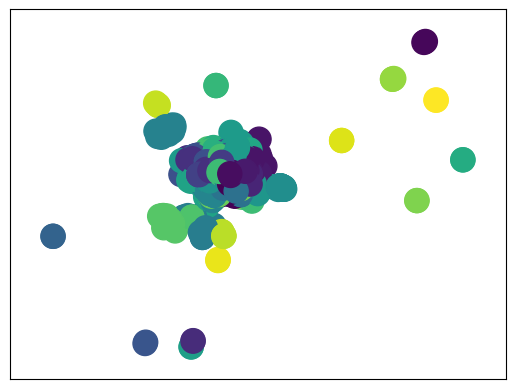

In [ ]:
# Get the best partition using the Louvain algorithm
partition = community_louvain.best_partition(G)

# Draw the graph with nodes colored according to their community
pos = nx.spring_layout(G)
cmap = plt.get_cmap('viridis')
nx.draw_networkx_nodes(G, pos, node_color=list(partition.values()), cmap=cmap)
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.show()

In [ ]:
# Create empty graph
G_of_actor_connections = nx.empty_graph(0)

# Create list of movie cast and dictionary of actors and genres
List_of_movie_cast = []
Actor_dict = {}
for i, row in nodes.iterrows():
    Actor_dict[row['ActorName']] = row['genres']

# Create list of edges
edges_list = [(row['from'], row['to']) for i, row in edges.iterrows()]

# Add edges to graph
G_of_actor_connections.add_edges_from(edges_list)

# Find best partition using Louvain algorithm
part = community.best_partition(G_of_actor_connections)

AttributeError: ignored

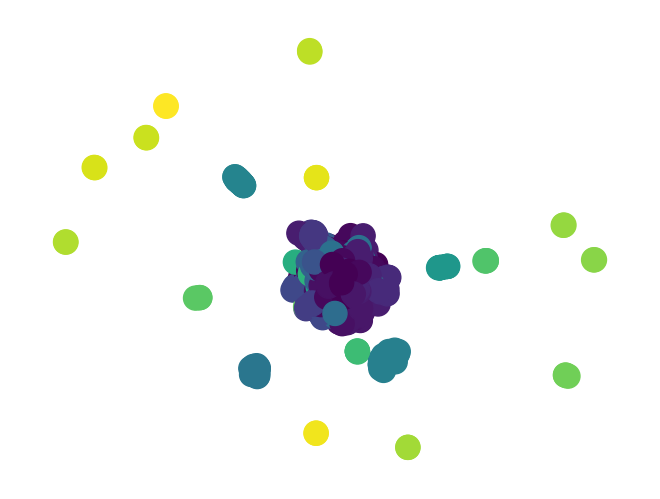

In [ ]:
from networkx.algorithms.community import greedy_modularity_communities

communities = greedy_modularity_communities(G)

# create a dictionary mapping each node to its community
community_dict = {}
for i, community in enumerate(communities):
    for node in community:
        community_dict[node] = i

# use the community membership to color the nodes
node_colors = [community_dict[node] for node in G.nodes()]

pos = nx.spring_layout(G)
nx.draw(G, pos=pos, node_color=node_colors)
plt.show()
